In [198]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")
sns.set(style="darkgrid")

In [199]:
file = '/content/C2_2017_Yellow_Taxi_Trip_Data.csv'

df = pd.read_csv(file).rename(columns={'Unnamed: 0': 'id'})

df['tpep_dropoff_datetime'] = pd.to_datetime(df['tpep_dropoff_datetime'], format="%m/%d/%Y %I:%M:%S %p")
df['tpep_pickup_datetime'] = pd.to_datetime(df['tpep_pickup_datetime'], format="%m/%d/%Y %I:%M:%S %p")

Описание столбцов:

- **ID** - Идентификационный номер поездки.

- **VendorID** - Код провайдера, предоставившего запись.

> 1) VeriFone Inc.

> 2) Creative Mobile Technologies, LLC;

- **tpep_pickup_datetime** - Дата и время, когда счетчик был включен.

- **tpep_dropoff_datetime** - Дата и время, когда счетчик был выключен.

- **Passenger_count** - Количество пассажиров в транспортном средстве.
Это значение, введенное водителем.

- **Trip_distance** - Пройденное расстояние в милях, показанное таксометром.

- **PULocationID** - Зона такси TLC, в которой был включен таксометр.

- **DOLocationID** - Зона такси TLC, в которой был выключен таксометр.

- **RateCodeID** - Окончательный код тарифа, действующий в конце поездки.


> 1) Standard rate - стандартная поездка

> 2) JFK - Международный аэропорт имени Джона Кеннеди

> 3) Newark

> 4) Nassau or Westchester

> 5) Negotiated fare - cогласованный тариф

> 6) Group ride - групповая поездка

- **Store_and_fwd_flag** - Этот флаг указывает, хранилась ли запись о поездке в памяти транспортного средства перед отправкой поставщику, иначе называемой “сохранить и переслать”, поскольку у транспортного средства не было подключения к серверу.

> Y - хранение и переадресация

> N - не хранение и переадресация

- **Payment_type** - Цифровой код, обозначающий, как пассажир оплатил поездку.

> 1) Credit card - кредитная карта

> 2) Cash - наличные

> 3) No charge - бесплатно

> 4) Dispute - конфликт

> 5) Unknown - неизвестно

> 6) Voided trip - аннулированная поездка

- **Fare_amount** - Стоимость проезда по времени и расстоянию, рассчитанная с помощью счетчика.

- **Extra** - Прочие дополнительные услуги и доплаты. В настоящее время сюда входят только сборы в размере 0,50 и 1 доллара США в час пик и за ночь.

- **MTA_tax** - Налог в размере 0,50 доллара США в год, который автоматически взимается в зависимости от используемой учетной ставки.

- **Improvement_surcharge** - Надбавка за улучшение в размере 0,30 доллара США начислялась за поездки при снятии флага. Надбавка за улучшение начала взиматься в 2015 году.

- **Tip_amount** - Сумма чаевых – Это поле автоматически заполняется для чаевых по кредитной карте. Чаевые наличными не включены.

- **Tolls_amount** - Общая сумма всех сборов, уплаченных за поездку.

- **Total_amount** - Общая сумма, взимаемая с пассажиров. Не включает чаевые наличными.

Добавленные признаки:

- **Trip_duration** - Общая длина поездки в секундах.
- **log_trip_duration**	- Логарифм длины поездки.
- **log_total_amount** - Логарифм общей стоимости поездки.
- **speed** - Скорость поездки.
- **date** - Дата поездки.
- **weekday**	- Номер дня недели поездки.
- **day_name** - Название дня недели поездки.
- **month_name**	- Название месяца поездки.
- **month**	- Номер месяца поездки.
- **hour**	- Время в часах начала поездки.
- **yearday**	- Номер дня поездки в году.


Так выглядят наши первоначальные данные в табличном виде.

In [200]:
df

,id,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.00,0.3,16.56
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.00,0.3,20.80
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.00,0.3,8.75
3,38942136,2,2017-05-07 13:17:59,2017-05-07 13:48:14,1,3.70,1,N,188,97,1,20.5,0.0,0.5,6.39,0.00,0.3,27.69
4,30841670,2,2017-04-15 23:32:20,2017-04-15 23:49:03,1,4.37,1,N,4,112,2,16.5,0.5,0.5,0.00,0.00,0.3,17.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22694,14873857,2,2017-02-24 17:37:23,2017-02-24 17:40:39,3,0.61,1,N,48,186,2,4.0,1.0,0.5,0.00,0.00,0.3,5.80
22695,66632549,2,2017-08-06 16:43:59,2017-08-06 17:24:47,1,16.71,2,N,132,164,1,52.0,0.0,0.5,14.64,5.76,0.3,73.20
22696,74239933,2,2017-09-04 14:54:14,2017-09-04 14:58:22,1,0.42,1,N,107,234,2,4.5,0.0,0.5,0.00,0.00,0.3,5.30
22697,60217333,2,2017-07-15 12:56:30,2017-07-15 13:08:26,1,2.36,1,N,68,144,1,10.5,0.0,0.5,1.70,0.00,0.3,13.00


# Работа с показателями поездок

Добавим столбец длительность поездки в секундах.

In [201]:
df['trip_duration'] = (df['tpep_dropoff_datetime'] - df['tpep_pickup_datetime']).dt.total_seconds()

**Для начала построим гистограмму распределения длины поездки.**

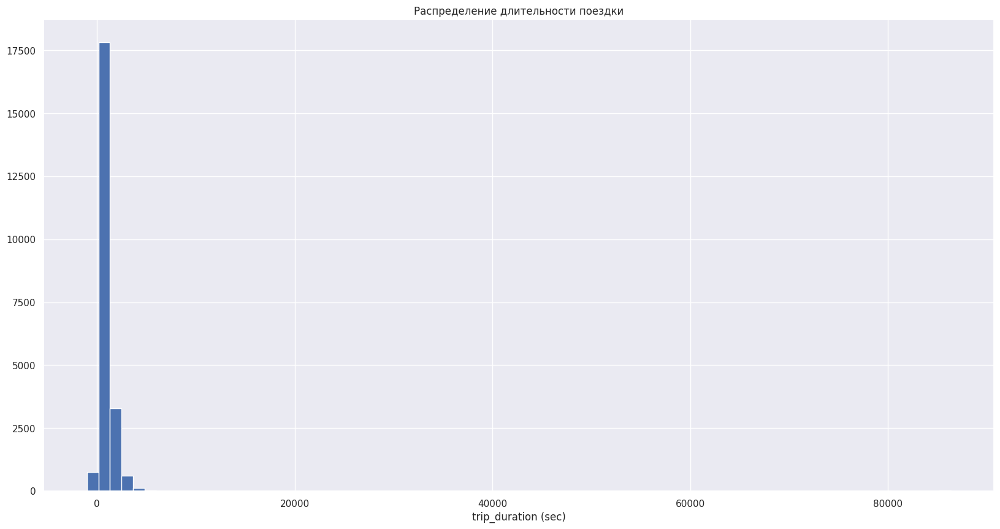

In [206]:
fig, ax = plt.subplots(1, figsize=(20,10))
h = ax.hist(df.trip_duration, bins=75)
ax.set(title = 'Распределение длительности поездки', xlabel='trip_duration (sec)')
plt.show()

Судя по гистаграмме можно отметить большое количество "тяжелых" выбросов и неравномерное распределение длительности поездки. Для более красивого графика распределения возьмем логарифм от длительности поездки.

In [203]:
df['log_trip_duration'] = np.log1p(df['trip_duration'])

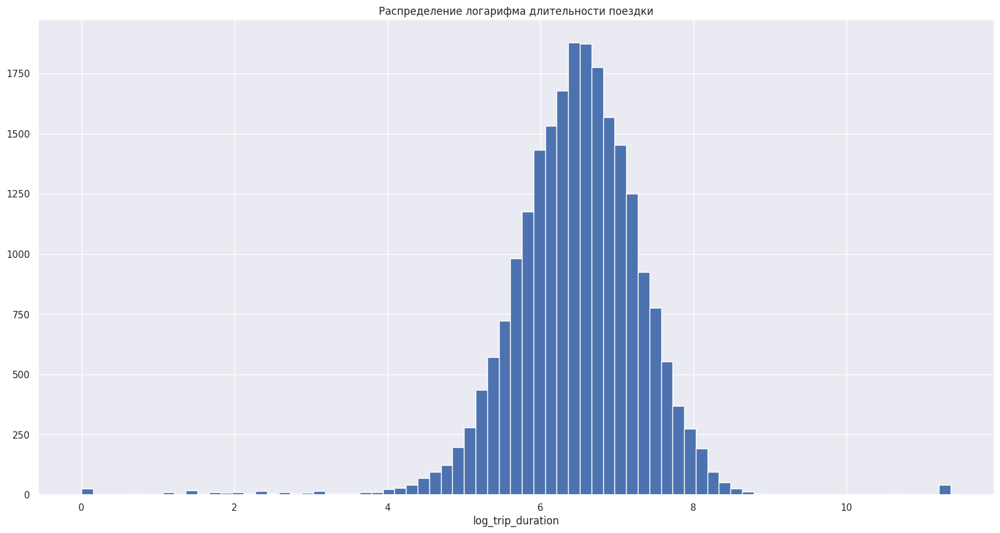

In [207]:
fig, ax = plt.subplots(1, figsize=(20,10))
h = ax.hist(df.log_trip_duration, bins=75)
ax.set(title = 'Распределение логарифма длительности поездки', xlabel='log_trip_duration')
plt.show()

Теперь можно говорить о нормальном распределении логарифма длительности поездки.

**Аналогичные графики построим и для распределения стоимости поездки.**

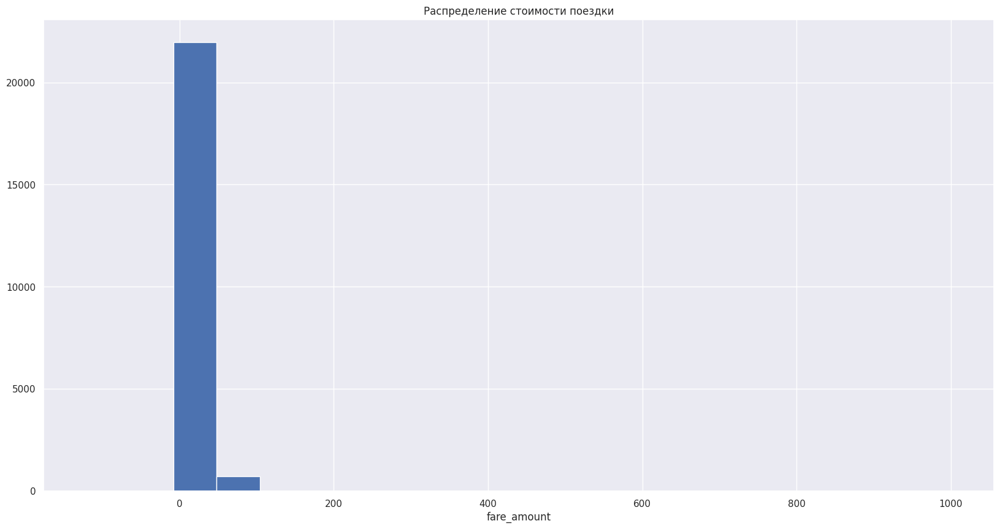

In [214]:
fig, ax = plt.subplots(1, figsize=(20,10))
h = ax.hist(df.fare_amount, bins=20)
ax.set(title = 'Распределение стоимости поездки', xlabel='fare_amount')
plt.show()

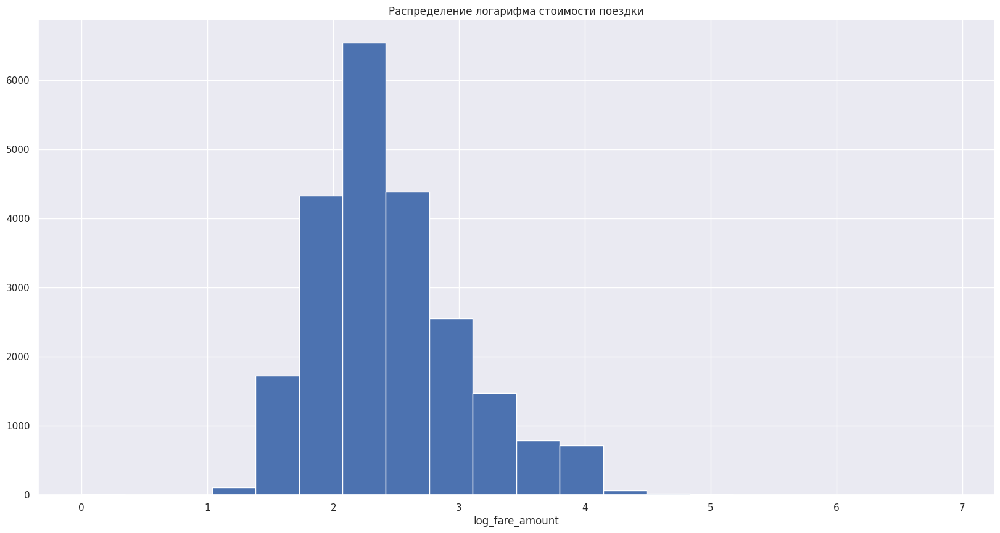

In [213]:
fig, ax = plt.subplots(1, figsize=(20,10))
h = ax.hist(np.log1p(df.fare_amount), bins=20)
ax.set(title = 'Распределение логарифма стоимости поездки', xlabel='log_fare_amount')
plt.show()

Распределение логарифма стоимости получилось не таким красивым, как длительности, но можно предположить, что в основном стоимость стремится к средней.

**Аналогичные графики построим и для распределения скорости поездки.**

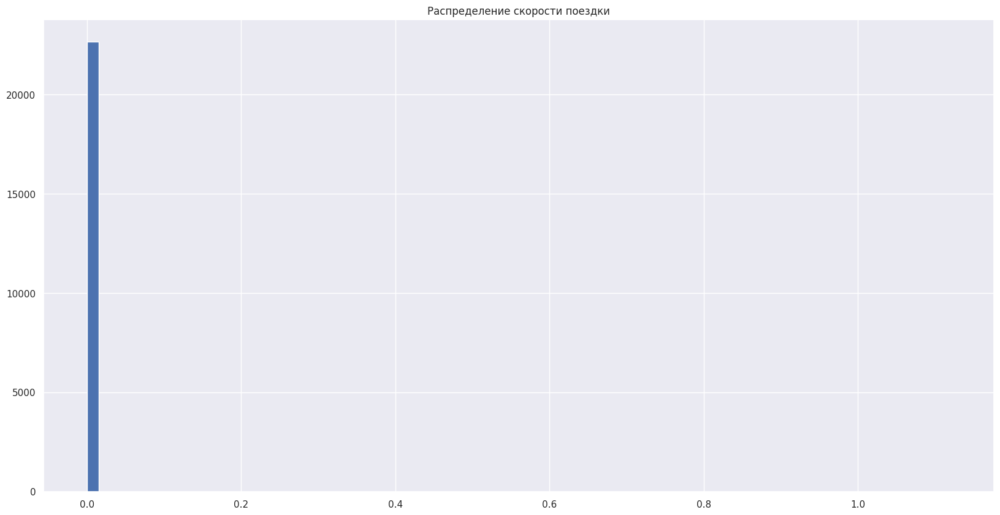

In [232]:
df['speed'] = np.log1p(df['trip_distance'])/(np.exp(df['log_trip_duration'])-1) #создадим столбец скорости поездки

fig, ax = plt.subplots(1, figsize=(20,10))
h = ax.hist(df['speed'], bins=75)
ax.set(title = 'Распределение скорости поездки')
plt.show()

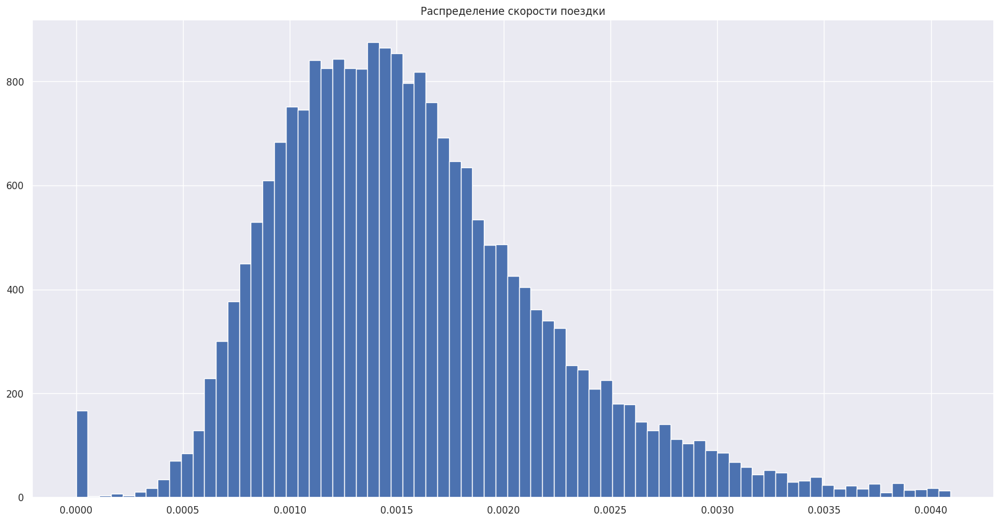

In [ ]:
fig, ax = plt.subplots(1, figsize=(20,10))
h = ax.hist(df[df['speed'] <= df['speed'].quantile(0.99)].speed, bins=75)
ax.set(title = 'Распределение скорости поездки')
plt.show()

Теперь можно говорить о нормальном распределении логарифма скорости поездки. Также на графике мы видим столбик на значении 0, что означает существование вероятно случайно созданных поездок или отмененных, когда такси не находилось в движении.

## Блок работы с данными по датам и времени

**Теперь построим ежедневное распределение количества поездок.**

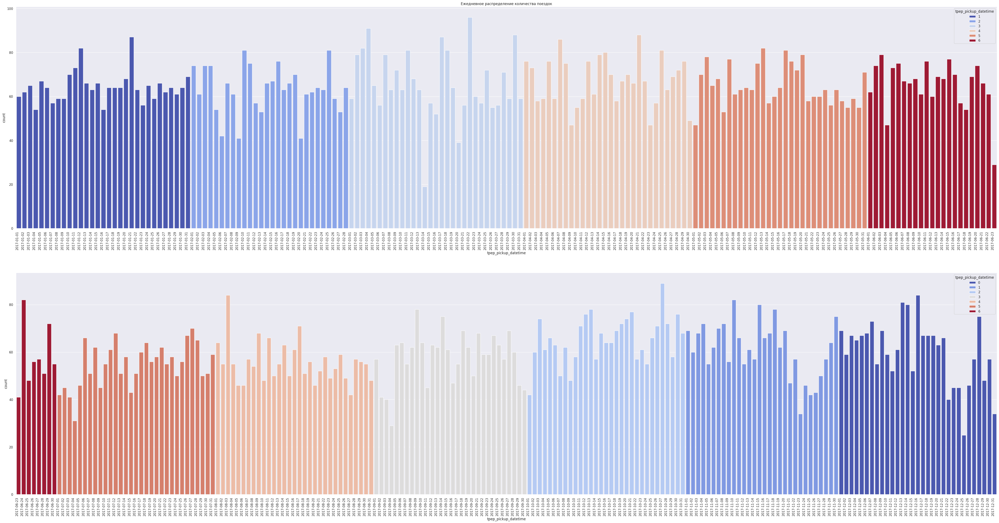

In [191]:
from datetime import datetime

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(60, 30))

sns.countplot(x=df.sort_values('tpep_pickup_datetime')['tpep_pickup_datetime'][:11349].dt.date, hue = df.sort_values('tpep_pickup_datetime')['tpep_pickup_datetime'][:11349].dt.month, palette="coolwarm", ax=ax1)
ax1.set_title('Ежедневное распределение количества поездок')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha='right');

sns.countplot(x=df.sort_values('tpep_pickup_datetime')['tpep_pickup_datetime'][11349:].dt.date, hue = 12 - df.sort_values('tpep_pickup_datetime')['tpep_pickup_datetime'][11349:].dt.month, palette="coolwarm", ax=ax2)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90, ha='right');

В некоторых местах графика заметны резкие падения числа поездок. Выведем даты с наименьшими значениями количества поездок и попробуем их проинтерпретировать.

In [133]:
df['tpep_pickup_datetime'].dt.date.value_counts(ascending = True).head(6)

2017-03-14    19
2017-12-25    25
2017-09-04    29
2017-07-04    31
2017-11-23    34
2017-12-31    34
Name: tpep_pickup_datetime, dtype: int64

По датам падения можно выделить следующие события:

- 2017-03-14 - сильный снегопад
- 2017-12-25 - Рождество
- 2017-09-04 - протесты + терракты у Trump Tower
- 2017-11-23 - протесты + терракты
- 2017-07-04 - День Независимости США
- 2017-12-31 - Новый Год

Все эти события вполне логично объясняют сокращение числа поездок.

**Введем дополнительные столбцы для легкости работы с временем и датами.**

In [216]:
df['date'] = df.tpep_pickup_datetime.dt.date
df['weekday'] = df.tpep_pickup_datetime.dt.dayofweek
df['day_name'] = df.tpep_pickup_datetime.dt.day_name()
df['month_name'] = df.tpep_pickup_datetime.dt.month_name()
df['month'] = df.tpep_pickup_datetime.dt.month
df['hour'] = df.tpep_pickup_datetime.dt.hour
df['yearday'] = df.tpep_pickup_datetime.dt.dayofyear
df_daily = df.groupby('date').agg({'id' : 'count'}).reset_index()

**Построим точечный график зависимости количества поездок от дня недели.**

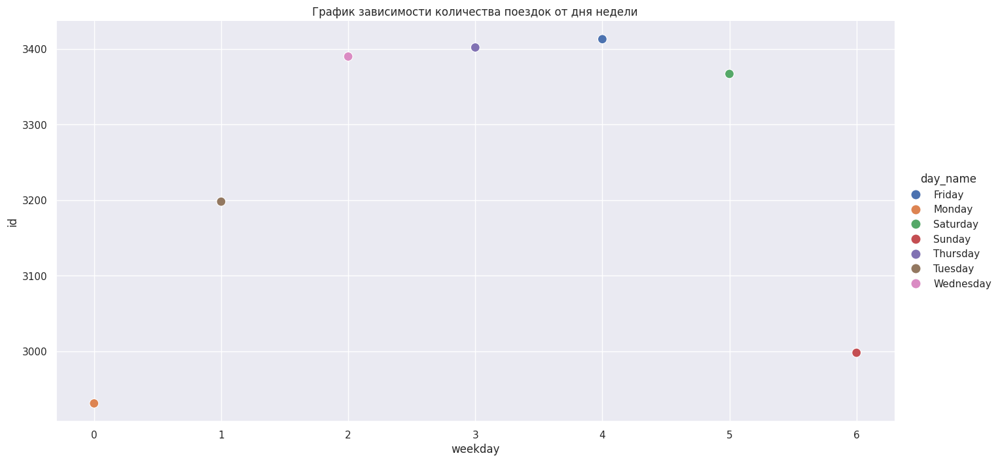

In [226]:
sns.relplot(data=df.groupby(['day_name', 'weekday']).agg({'id' : 'count'}).reset_index(), x='weekday', y='id', hue='day_name', height = 7, aspect = 2, s = 100)
plt.title('График зависимости количества поездок от дня недели');

По графику можно сделать вывод о том, что больше всего поездок выпадает на пятницу и меньше всего на понедельник. При этом основная доля поездок приходится на будние дни.

**Построим точечный график зависимости количества поездок от часов в сутках.**

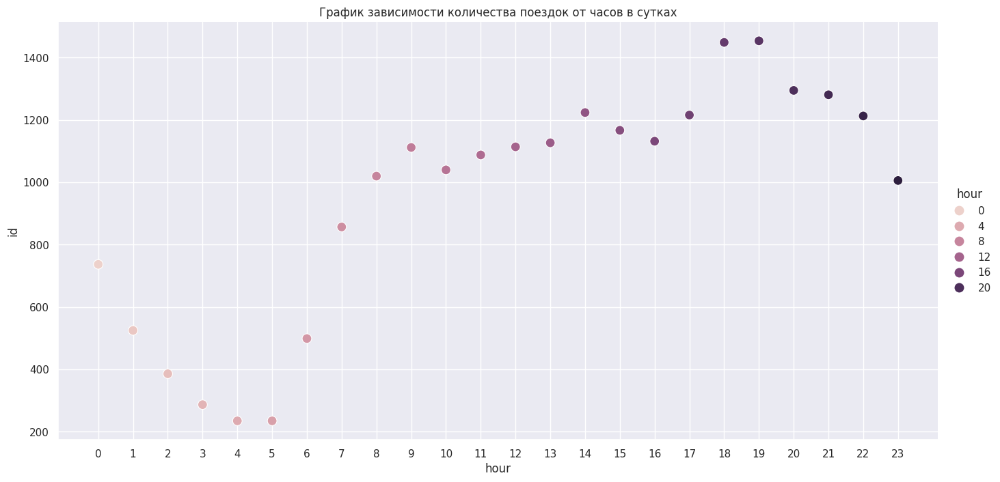

In [227]:
sns.relplot(data=df.groupby(['hour']).agg({'id' : 'count'}).reset_index(), x='hour', y='id', hue='hour', height = 7, aspect= 2, s = 100)
plt.xticks(np.array(range(24)));
plt.title('График зависимости количества поездок от часов в сутках');

По графику можно сделать вывод о том, что больше всего поездок выпадает на 18-19 часов и меньше всего на 4-5 часов. При этом основная доля поездок приходится на рабочее время.

**Построим график зависимости количества поездок от часа в сутках для разных месяцев.**

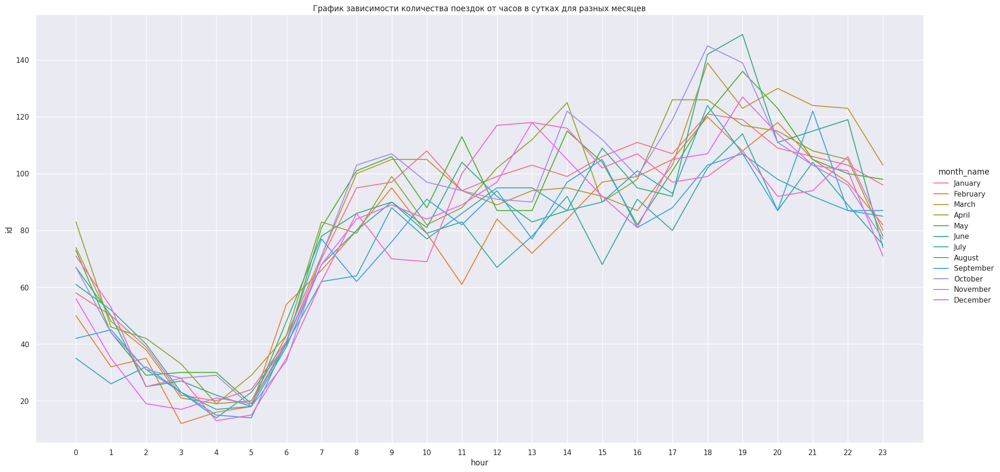

In [228]:
sns.relplot(data=df.groupby(['month', 'hour', 'month_name']).agg({'id' : 'count'}).reset_index(), x='hour', y='id', hue='month_name', height = 10, aspect= 2, kind = 'line')
plt.xticks(np.array(range(24)));
plt.title('График зависимости количества поездок от часов в сутках для разных месяцев');

По графику можно отметить, что в зависимости от месяцев количество поездок не сильно меняется и находится близко к средним значениям по часам.

**Построим график зависимости количества поездок от часа в сутках для разных дней недели.**

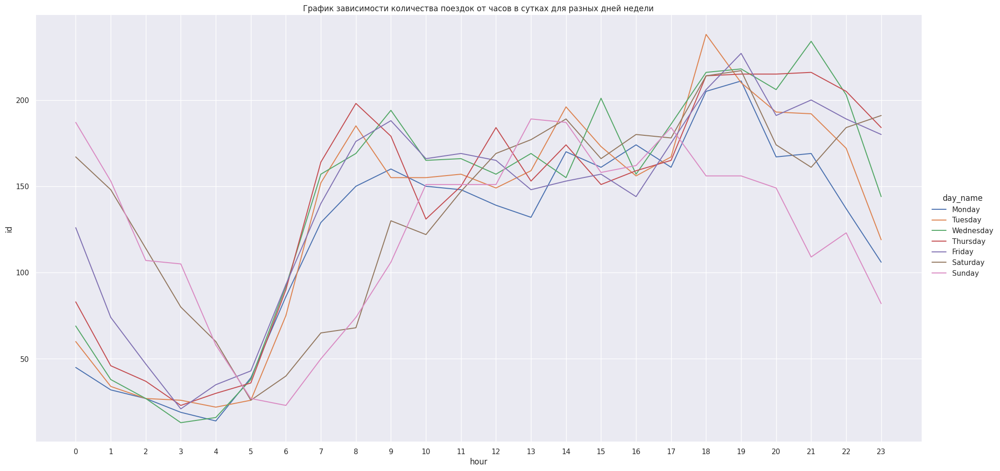

In [229]:
sns.relplot(data=df.groupby(['weekday', 'hour', 'day_name']).agg({'id' : 'count'}).reset_index(), x='hour', y='id', hue='day_name', height = 10, aspect= 2, kind = 'line')
plt.xticks(np.array(range(24)));
plt.title('График зависимости количества поездок от часов в сутках для разных дней недели');

Ситуация на графике близка к ситации с месяцами, но наглядно видно, что в выходные увеличивается количество ночных поездок и уменьшается количество поездок рано утром.

**Построим график зависимости среднего логарифма времени поездки от дня недели.**

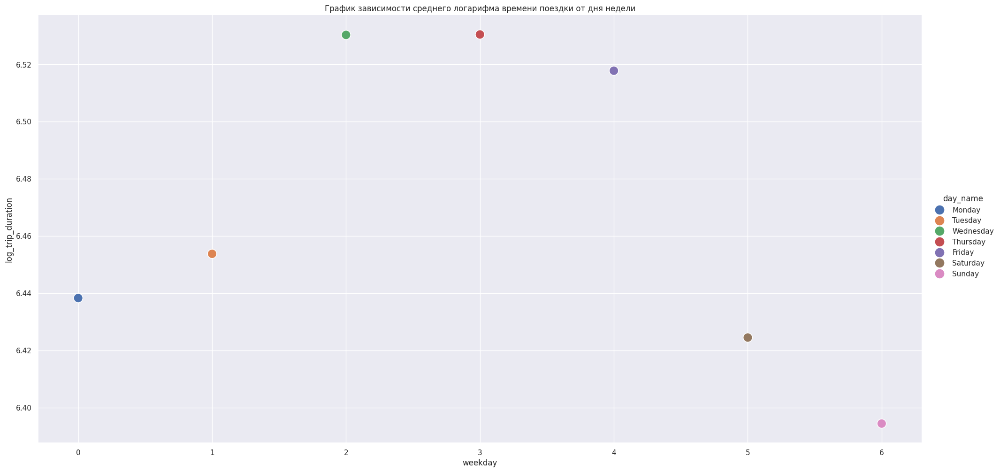

In [230]:
sns.relplot(data=df.groupby(['weekday', 'day_name']).agg({'log_trip_duration' : 'mean'}).reset_index(), x='weekday', y='log_trip_duration', hue='day_name', height = 10, aspect= 2, s = 200)
plt.title('График зависимости среднего логарифма времени поездки от дня недели');

На графике видно, что самые длительные поездки совершаются со среды по пятницу.

**Построим график зависимости среднего логарифма времени поездки от времени суток.**

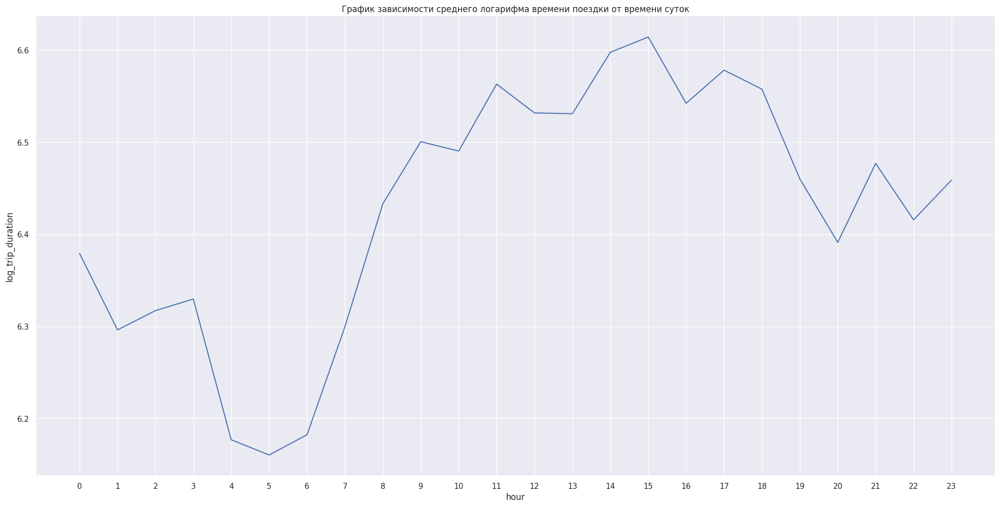

In [231]:
sns.relplot(data=df.groupby(['hour']).agg({'log_trip_duration' : 'mean'}).reset_index(), x='hour', y='log_trip_duration', height = 10, aspect= 2, kind = 'line')
plt.xticks(np.array(range(24)));
plt.title('График зависимости среднего логарифма времени поездки от времени суток');

На графике видно, что самые длительные поездки совершаются в рабочее время.

**Построим график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости.**

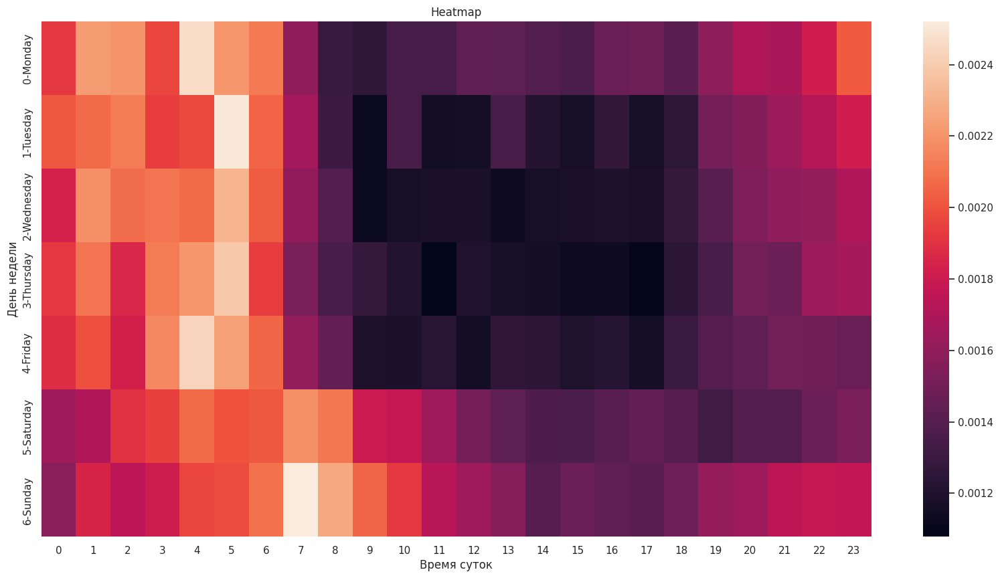

In [143]:
med = df.groupby(['weekday', 'day_name', 'hour']).speed.median().unstack()
fig, ax = plt.subplots(1, figsize=(20,10))

sns.heatmap(med, ax=ax)

ax.set(
    title = 'Heatmap',
    xlabel = 'Время суток',
    ylabel='День недели')

plt.show()

Исходя из графика, мы можем сказать, что скорость максимальна ранним утром (4-5 утра по будням и 6 часов в воскресенье) и минимальна в рабочее время со вторника по пятницу.

# Работа с признаками по оплате

Введем признак логарифма финальной стоимости поездки.

In [234]:
df['log_total_amount'] = np.log1p(df['total_amount'])

Первым признаком для рассмотрения будет тип оплаты.

In [235]:
df['payment_type'].value_counts()

1    15265
2     7267
3      121
4       46
Name: payment_type, dtype: int64

Больше всего люди платят кредитной картой.

**Теперь построим boxplot для зависимости типа оплаты от логарифма стоимости поездки.**

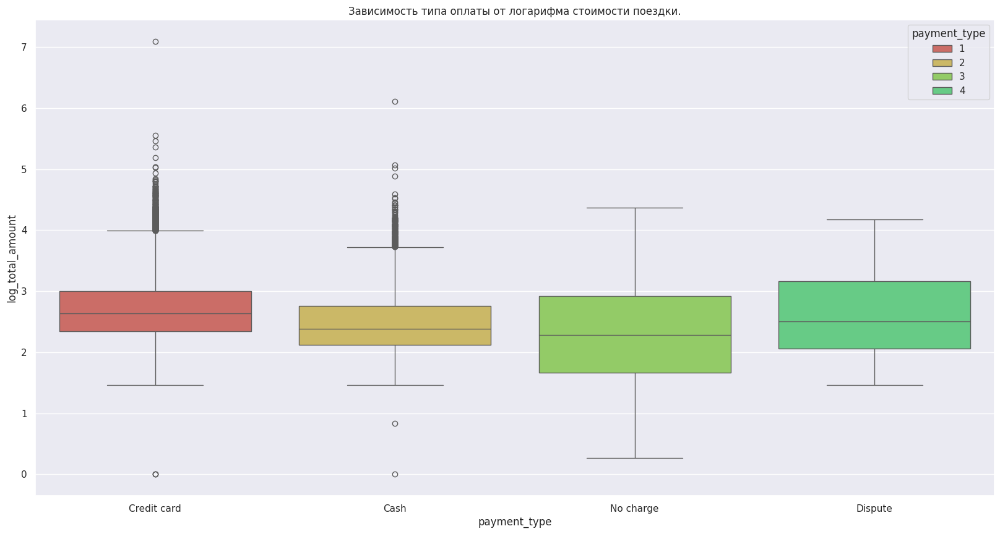

In [236]:
fig, ax = plt.subplots(1, figsize=(20,10))

sns.boxplot(data=df, x='payment_type', y='log_total_amount', palette = sns.color_palette("hls", 8), hue = 'payment_type', ax=ax)
ax.set_xticklabels(['Credit card', 'Cash', 'No charge', 'Dispute'])

ax.set_title('Зависимость типа оплаты от логарифма стоимости поездки.')
ax.set(xlabel = 'payment_type', ylabel='log_total_amount')

plt.show()

Тип оплаты не зависит явно от стоимости поездки, но все же дорогие поездки больше оплачиваются картой. Также можно сделать вывод, что стоимость поездки чаще оказывается выше медианного значения, чем наоборот.

**Построим график зависимости чаевых от стоимости поездки.**

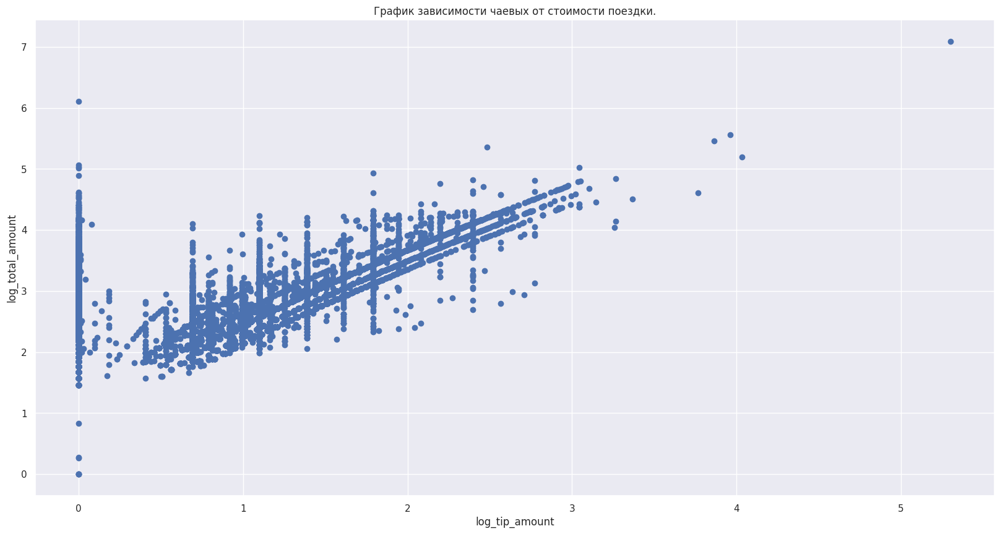

In [238]:
fig, ax = plt.subplots(1, figsize=(20,10))

plt.scatter(x = np.log1p(df['tip_amount']), y = df['log_total_amount'])
ax.set_title('График зависимости чаевых от стоимости поездки.')
ax.set(xlabel='log_tip_amount', ylabel='log_total_amount')

plt.show()

Так как разброс значений небольшой, мы взяли логарифмы. По графику отслеживается линейная зависимость логарифма чаевых от логарифма стоимости. Столбики точек говорят о склонности людей округлять, так как чаевые учтены только по карте, а не наличными.

Теперь разберемся со сборами, основная масса равна нулю или фиксированным значениям, которые мы видим ниже.

In [ ]:
df['tolls_amount'].value_counts().head(15)

0.00     21525
5.76       847
5.54       239
10.50       21
12.50       11
2.64        10
2.54         6
11.52        3
16.26        3
16.50        2
16.00        2
8.50         2
18.00        2
15.50        2
18.28        1
Name: tolls_amount, dtype: int64

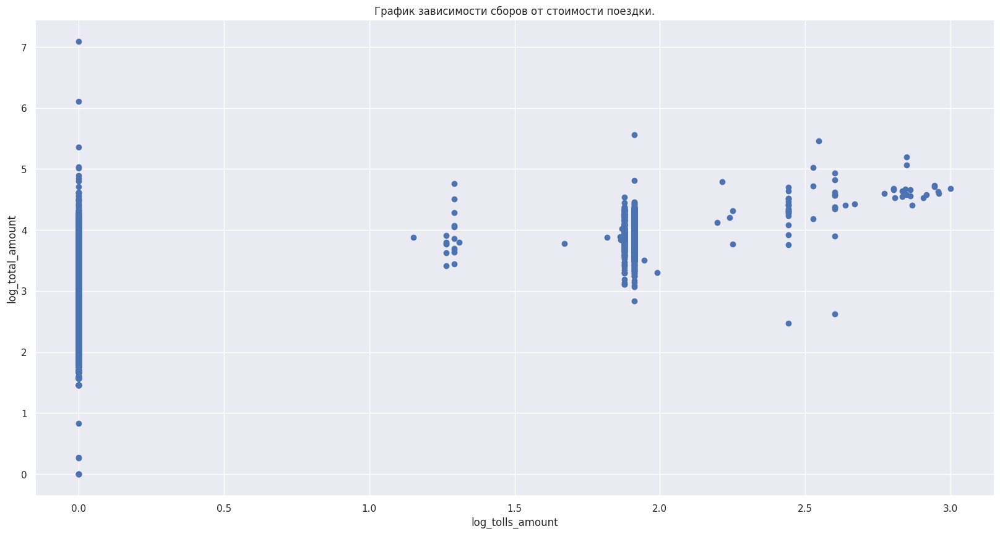

In [239]:
fig, ax = plt.subplots(1, figsize=(20,10))

plt.scatter(x = np.log1p(df['tolls_amount']), y = df['log_total_amount'])

ax.set_title('График зависимости сборов от стоимости поездки.')
ax.set(xlabel='log_tolls_amount', ylabel='log_total_amount')

plt.show()

Судя по графику мы видим ту же самую картину. Сборы обычно фиксированы и не зависят от стоимости поездки.

**Построим график для зависимости значения extra от времени суток.**

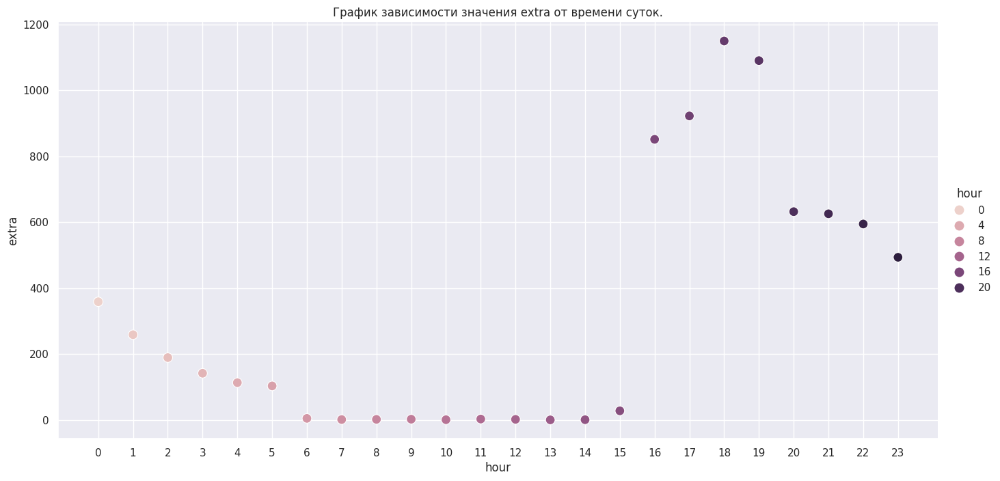

In [241]:
sns.relplot(data=df.groupby(['hour']).agg({'extra' : 'sum'}).reset_index(), x='hour', y='extra', hue='hour', height = 7, aspect= 2, s = 100)
plt.xticks(np.array(range(24)));
plt.title('График зависимости значения extra от времени суток.');

В описании столбцов указано, что столбец extra отвечает за прочие дополнительные услуги и доплаты. В настоящее время сюда входят только сборы в размере 0,50 и 1 доллара США в час пик и за ночь.

Из графика мы наблюдает именно это. Наивысшая сумма сборов extra в **час пик 18-19 часов**, также средние ненулевые значения наблюдаются ночью. Днем же данный сбор не действует.

# Работа с оставшимися признаками

Количество информации от двух вендоров примерно одинаковое.

In [144]:
df['VendorID'].value_counts()

2    12626
1    10073
Name: VendorID, dtype: int64

**Построим boxplot зависимости стоимости поездки от вендора.**

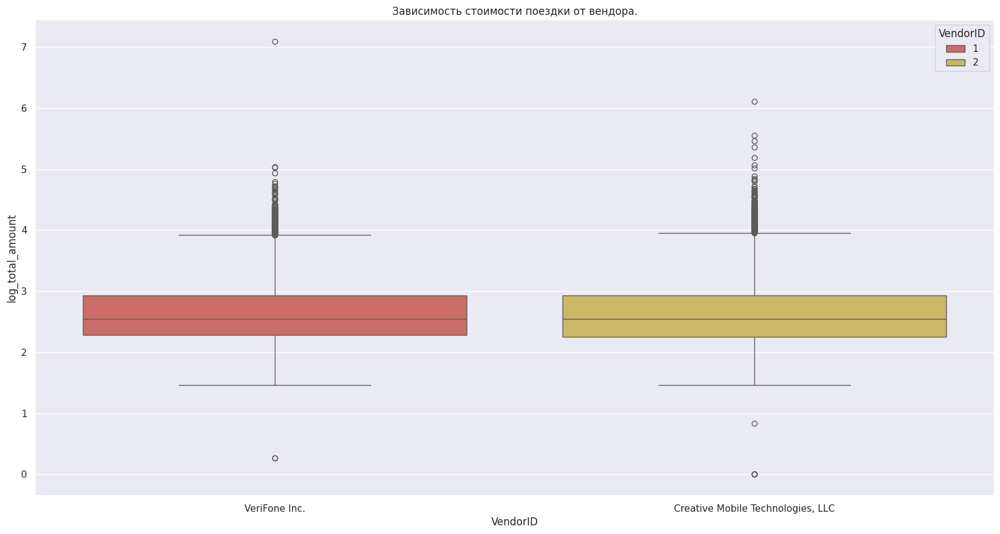

In [242]:
sns.color_palette("hls", 8)

fig, ax = plt.subplots(1, figsize=(20,10))

sns.boxplot(data=df, x='VendorID', y='log_total_amount', palette = sns.color_palette("hls", 8), hue='VendorID', ax=ax)
ax.set_xticklabels(['VeriFone Inc.', 'Creative Mobile Technologies, LLC'])
ax.set_title('Зависимость стоимости поездки от вендора.')

ax.set(xlabel = 'VendorID', ylabel='log_total_amount')

plt.show()

Зависимости стоимости от вендора не наблюдается, но мы также отмечаем тенденцию стоимости подниматься только выше медианы.

Теперь посмотрим на признак количества пассажиров. Больше всего ездят по одному или двое.

In [161]:
df['passenger_count'].value_counts()

1    16117
2     3305
5     1143
3      953
6      693
4      455
0       33
Name: passenger_count, dtype: int64

**Построим boxplot зависимости длительности поездки от количества пассажиров.**

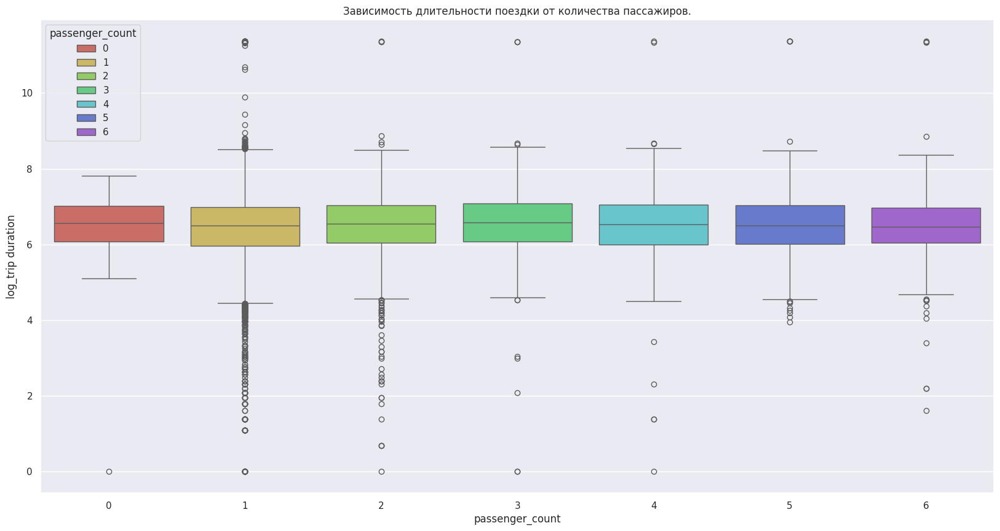

In [243]:
fig, ax = plt.subplots(1, figsize=(20,10))

sns.boxplot(data=df, x='passenger_count', y='log_trip_duration', palette = sns.color_palette("hls", 8), hue = 'passenger_count', ax=ax)

ax.set_title('Зависимость длительности поездки от количества пассажиров.')

ax.set(xlabel = 'passenger_count', ylabel='log_trip duration')

plt.show()

Явной зависимости длительности поездки от числа пассажиров нет. Но для одного пассажира и двух разброс длительности гораздо больше, чем в других вариантах.

**Построим boxplot зависимости стоимости поездки от количества пассажиров.**

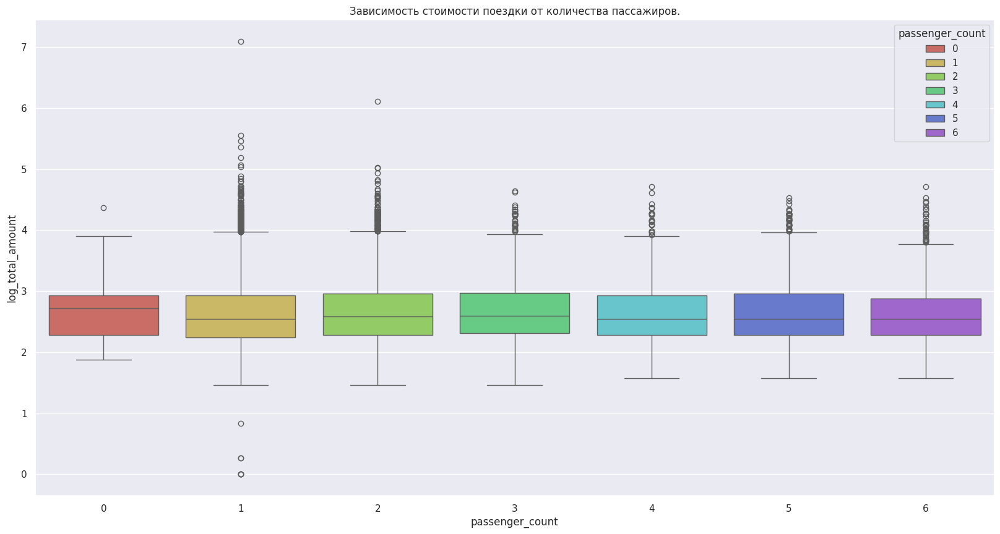

In [244]:
fig, ax = plt.subplots(1, figsize=(20,10))

sns.boxplot(data=df, x='passenger_count', y='log_total_amount', palette = sns.color_palette("hls", 8), hue = 'passenger_count', ax=ax)

ax.set_title('Зависимость стоимости поездки от количества пассажиров.')

ax.set(xlabel = 'passenger_count', ylabel='log_total_amount')

plt.show()

Здесь также не наблюдается явной зависимости, но медиана стоимости 0 пассажиров по какой-то причине немного больше остальных. Возможно водитель забывал выключить счетчик.

Теперь посмотрим на типы поездок. Чаще всего люди выбирают стандартные поездки.

In [162]:
df['RatecodeID'].value_counts()

1     22070
2       513
5        68
3        39
4         8
99        1
Name: RatecodeID, dtype: int64

**Построим boxplot зависимости длительности поездки от типа поездки.**

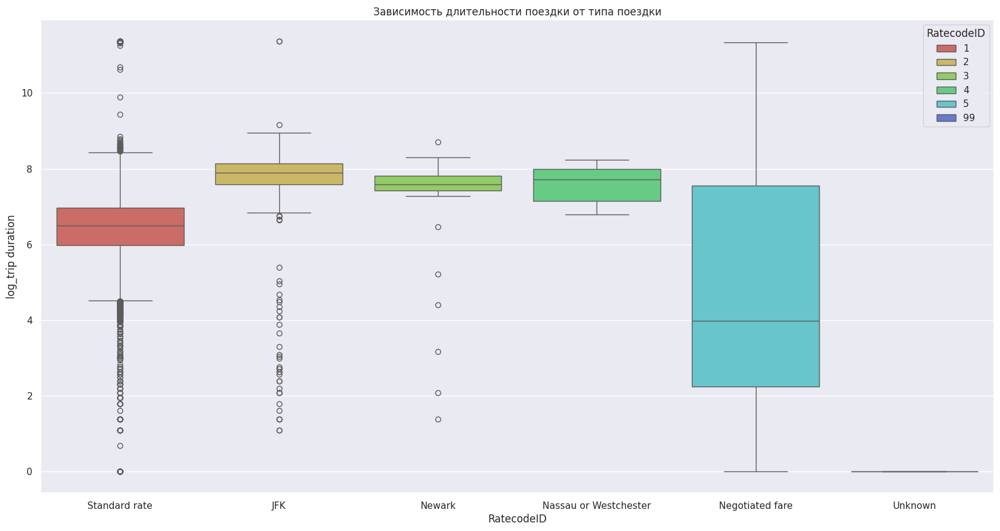

In [245]:
fig, ax = plt.subplots(1, figsize=(20,10))

sns.boxplot(data=df, x='RatecodeID', y='log_trip_duration', palette = sns.color_palette("hls", 8), hue = 'RatecodeID', ax=ax)
ax.set_xticklabels(['Standard rate', 'JFK', 'Newark', 'Nassau or Westchester', 'Negotiated fare', 'Unknown'])

ax.set_title('Зависимость длительности поездки от типа поездки')

ax.set(xlabel = 'RatecodeID', ylabel='log_trip duration')

plt.show()

Мы видим, что самые длительные поездки до аэропортов JFK и Newark. Также замечаем новое категориальное значение 99, которое не было указано в описании признака. Скорее всего, тип поездки был не указан. Также смотрим на межквартильный размах у согласованного тарифа длительность поездки по согласованному тарифу очень сильно разнится.

**Положительных значений флага хранилась ли запись о поездке в памяти транспортного средства перед отправкой поставщику очень мало. Поэтому на boxplote вы видим картину типичную только лишь для дисбаланса меток.**

In [163]:
df['store_and_fwd_flag'].value_counts()

N    22600
Y       99
Name: store_and_fwd_flag, dtype: int64

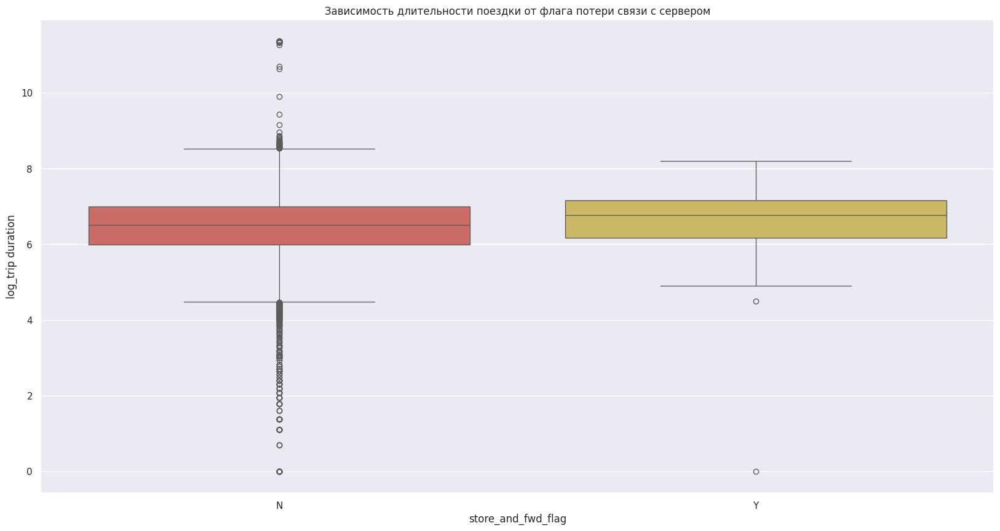

In [246]:
fig, ax = plt.subplots(1, figsize=(20,10))

sns.boxplot(data=df, x='store_and_fwd_flag', y='log_trip_duration', palette = sns.color_palette("hls", 8), hue = 'store_and_fwd_flag', ax=ax)

ax.set(title = 'Зависимость длительности поездки от флага потери связи с сервером', xlabel = 'store_and_fwd_flag', ylabel='log_trip duration')

plt.show()

# Работа с картой

Так как такси очень сильно завязано на локациях, я решила использовать дополнительные данные о локациях, в которых совершались поездки, для визуализации.

In [154]:
filezones = '/content/taxi_zones.csv' #data from https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc

zones = pd.read_csv(filezones)

In [155]:
zones

,OBJECTID,Shape_Leng,the_geom,Shape_Area,zone,LocationID,borough
0,1,0.116357,MULTIPOLYGON (((-74.18445299999996 40.69499599...,0.000782,Newark Airport,1,EWR
1,2,0.433470,MULTIPOLYGON (((-73.82337597260663 40.63898704...,0.004866,Jamaica Bay,2,Queens
2,3,0.084341,MULTIPOLYGON (((-73.84792614099985 40.87134223...,0.000314,Allerton/Pelham Gardens,3,Bronx
3,4,0.043567,MULTIPOLYGON (((-73.97177410965318 40.72582128...,0.000112,Alphabet City,4,Manhattan
4,5,0.092146,MULTIPOLYGON (((-74.17421738099989 40.56256808...,0.000498,Arden Heights,5,Staten Island
...,...,...,...,...,...,...,...
258,256,0.067915,MULTIPOLYGON (((-73.95834207500002 40.71330630...,0.000169,Williamsburg (South Side),256,Brooklyn
259,259,0.126750,MULTIPOLYGON (((-73.85107116191898 40.91037152...,0.000395,Woodlawn/Wakefield,259,Bronx
260,260,0.133514,MULTIPOLYGON (((-73.90175373399988 40.76077547...,0.000422,Woodside,260,Queens
261,261,0.027120,MULTIPOLYGON (((-74.01332610899988 40.70503078...,0.000034,World Trade Center,261,Manhattan


In [156]:
def convert_to_hex(rgba_color, color) :

    if color == 'blue':
      blue = str(hex(int(rgba_color*255)))[2:].capitalize()
      if blue =='0':
        blue = '00'
      red = '00'
      green='00'

    if color == 'red':
      red = str(hex(int(rgba_color*255)))[2:].capitalize()
      if red =='0':
        red = '00'
      blue = '00'
      green='00'

    return '#'+ red + green + blue

result = pd.merge(left=zones, right=df.groupby(['DOLocationID'])['DOLocationID'].count(), how='left', left_on='OBJECTID', right_index=True)
result = pd.merge(left=result, right=df.groupby(['PULocationID'])['PULocationID'].count(), how='left', left_on='OBJECTID', right_index=True)

result = result.fillna(0)
result[['DOLocationID',	'PULocationID']] = result[['DOLocationID',	'PULocationID']].astype(int)
result['colorDO'] = result['DOLocationID'].apply(lambda x: convert_to_hex(1 - (x / result['DOLocationID'].max()), color = 'blue'))
result['colorPU'] = result['PULocationID'].apply(lambda x: convert_to_hex(1 - (x / result['PULocationID'].max()), color = 'red'))

С помощью операций выше к исходной таблице по локациям добавила количество поездок из/в данную локацию и для визуализации поставила в соответствие количеству цвета, которые буду использовать на карте ниже.

In [157]:
result

,OBJECTID,Shape_Leng,the_geom,Shape_Area,zone,LocationID,borough,DOLocationID,PULocationID,colorDO,colorPU
0,1,0.116357,MULTIPOLYGON (((-74.18445299999996 40.69499599...,0.000782,Newark Airport,1,EWR,34,3,#0000F4,#Fe0000
1,2,0.433470,MULTIPOLYGON (((-73.82337597260663 40.63898704...,0.004866,Jamaica Bay,2,Queens,0,0,#0000Ff,#Ff0000
2,3,0.084341,MULTIPOLYGON (((-73.84792614099985 40.87134223...,0.000314,Allerton/Pelham Gardens,3,Bronx,0,0,#0000Ff,#Ff0000
3,4,0.043567,MULTIPOLYGON (((-73.97177410965318 40.72582128...,0.000112,Alphabet City,4,Manhattan,101,60,#0000E0,#Ed0000
4,5,0.092146,MULTIPOLYGON (((-74.17421738099989 40.56256808...,0.000498,Arden Heights,5,Staten Island,0,0,#0000Ff,#Ff0000
...,...,...,...,...,...,...,...,...,...,...,...
258,256,0.067915,MULTIPOLYGON (((-73.95834207500002 40.71330630...,0.000169,Williamsburg (South Side),256,Brooklyn,55,14,#0000Ee,#Fa0000
259,259,0.126750,MULTIPOLYGON (((-73.85107116191898 40.91037152...,0.000395,Woodlawn/Wakefield,259,Bronx,3,0,#0000Fe,#Ff0000
260,260,0.133514,MULTIPOLYGON (((-73.90175373399988 40.76077547...,0.000422,Woodside,260,Queens,19,21,#0000F9,#F80000
261,261,0.027120,MULTIPOLYGON (((-74.01332610899988 40.70503078...,0.000034,World Trade Center,261,Manhattan,117,130,#0000Dc,#D90000


**Нарисуем карту для визуализации, куда чаще всего ездят в такси.**

In [158]:
import folium
from shapely.geometry.multipolygon import MultiPolygon
from shapely import wkt


m = folium.Map(location=[40.6949, -74.1844], tiles="openstreetmap", zoom_start=10)

for i in result.index:
  fillColor = result['colorDO'][i]
  p = wkt.loads((result['the_geom'][i]))
  geo_j = folium.GeoJson(p, style_function=lambda x, fillColor=fillColor: {'fillColor': fillColor, 'weight' : 1, 'fillOpacity' : 0.7})
  folium.Popup(str(result['OBJECTID'][i]) + ': ' + result['zone'][i]).add_to(geo_j)
  geo_j.add_to(m)

m

В основном самые частые направления принадлежат Манхэттену и двум аэропортам. Мы видим это по интенсивности цветов полигонов на карте.

**Нарисуем карту для визуализации, куда чаще всего ездят в такси.**

In [169]:
import folium
from shapely.geometry.multipolygon import MultiPolygon
from shapely import wkt


m = folium.Map(location=[40.6949, -74.1844], tiles="openstreetmap", zoom_start=10)

for i in result.index:
  fillColor = result['colorPU'][i]
  p = wkt.loads((result['the_geom'][i]))
  geo_j = folium.GeoJson(p, style_function=lambda x, fillColor=fillColor: {'fillColor': fillColor, 'weight' : 1, 'fillOpacity' : 0.7})
  folium.Popup(str(result['OBJECTID'][i]) + ': ' + result['zone'][i]).add_to(geo_j)
  geo_j.add_to(m)

m

На данной карте мы видим практически аналогичную картину, но гораздо ярче здесь выделяются аэропорты.

**Построим табличку частоты поездок в завимости от района.**

Как мы уже увидели на карте, больше всего поездок по Манхэттэну.

In [172]:
pd.pivot_table(result, values=['PULocationID', 'DOLocationID'], index='borough', aggfunc='sum').sort_values(by='DOLocationID', ascending=False)

,DOLocationID,PULocationID
borough,,
Manhattan,20008,20602
Queens,1088,1399
Brooklyn,1068,317
Bronx,133,18
EWR,34,3
Staten Island,4,1


Подкрепим таблицу визуализацией.

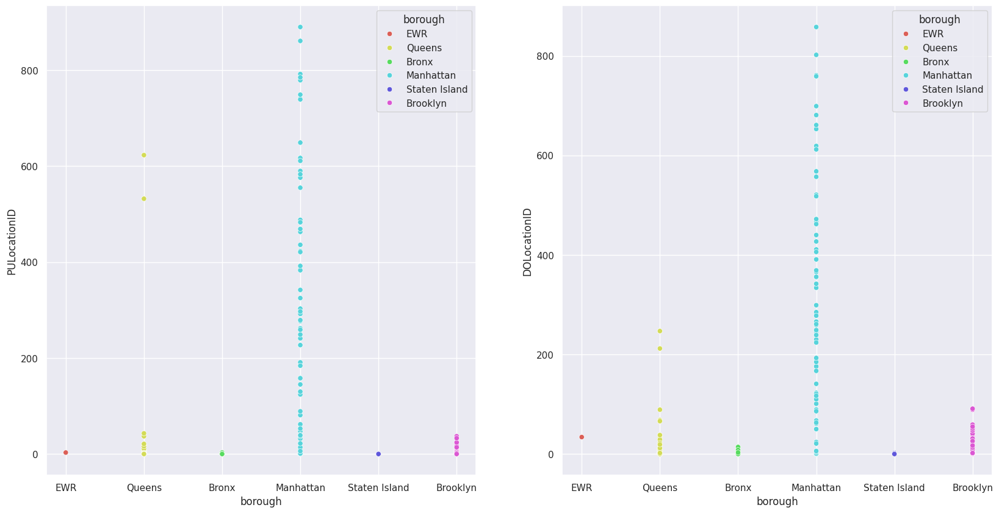

In [160]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))

sns.scatterplot(x='borough', y='PULocationID', data=result, palette = sns.color_palette("hls", 6), hue = 'borough', ax=ax[0])
sns.scatterplot(x='borough', y='DOLocationID', data=result, palette = sns.color_palette("hls", 6), hue = 'borough', ax=ax[1])

plt.show()

**Построим табличку самых частых зон направления.**
Здесь опять видим Манхэттэн в топе.

In [188]:
pd.pivot_table(result, values=['PULocationID'], index=['LocationID','zone', 'borough'], aggfunc='sum').sort_values(by='PULocationID', ascending=False)

,,,PULocationID
LocationID,zone,borough,
237,Upper East Side South,Manhattan,890
161,Midtown Center,Manhattan,861
186,Penn Station/Madison Sq West,Manhattan,792
236,Upper East Side North,Manhattan,785
162,Midtown East,Manhattan,779
...,...,...,...
157,Maspeth,Queens,0
156,Mariners Harbor,Staten Island,0
155,Marine Park/Mill Basin,Brooklyn,0


**Также строим табличку самых частых зон отправления.** Ситуация с Манхэттеном сохраняется. Если присмотреться, можно увидеть, что люди часто уезжают из центра и Times Square, видимо домой.

In [187]:
pd.pivot_table(result, values=['DOLocationID'], index=['LocationID','zone', 'borough'], aggfunc='sum').sort_values(by='DOLocationID', ascending=False)

,,,DOLocationID
LocationID,zone,borough,
161,Midtown Center,Manhattan,858
236,Upper East Side North,Manhattan,802
230,Times Sq/Theatre District,Manhattan,761
237,Upper East Side South,Manhattan,759
170,Murray Hill,Manhattan,699
...,...,...,...
20,Belmont,Bronx,0
108,Gravesend,Brooklyn,0
203,Rosedale,Queens,0
